## Dependecias
Para reproducir el nootebook, instalar las dependecias necesarias desde el archivo requirimets.txt

Se requiere python 3.8, se recomienda usar un virtualenv

```
pip install -r requirements.txt
python -m spacy download en_core_web_sm
``` 

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from collections import Counter
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from yellowbrick.classifier import confusion_matrix
from sklearn.metrics import classification_report, f1_score
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
from sklearn.preprocessing import FunctionTransformer
# modulos propios
from clean.clean_text import TicketMessage, stop_words
from train_model import SelectModel
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from joblib import dump
import seaborn as sns

# Challenge Shasa
## Ismael Orihuela

Se tienen dos datasets; customer-issues-train.csv y customer-issues-test.csv con tickets de una entidad financiera, los cuales contienen texto relaciona a quejas de los clientes, respecto a diversos productos que ofrece la entidad.

El objetivo es creer un clasificador de texto, para determinar el tipo de producto de acuerdo con el mensaje escrito por los usuarios.

Al revisar los datos sólo se cuenta con datos etiquetados en el archivo "customer-issues-train.csv", así que usa este conjunto para entrenar y testear el modelo, y se usara "customer-issues-test.csv" como conjunto de validación.


In [10]:
train = pd.read_csv("data/customer-issues-train.csv",
        usecols=["date-received", "product", "sub-product", "issue","sub-issue",
                "consumer-message", "state","complaint-id"],
        sep=",",parse_dates=["date-received"])

test = pd.read_csv("data/customer-issues-test.csv", sep=",",
                    usecols=['date-received', 'consumer-message',
                            'state','complaint-id'],
                    parse_dates=["date-received"])


# agregar un columna adicional para indentificar el dataset
train["type"] = "train"
test["type"] = "test"

In [11]:
# número de registros en train y test
print(f"registros en train {train.shape[0]:,}" )
print(f"registros en test {test.shape[0]:,}" )
print(f"total de registros {test.shape[0] + train.shape[0]:,}" )

registros en train 133,983
registros en test 65,987
total de registros 199,970


Se tiene en total **199,970** registros, pero sólo usa el dataset de train, se hace un append de ambos dataset, para hacer más sencillo el análisis y limpiar todos los texto.

In [12]:
# unir ambos datasets para hacer más fácil su analisis
merged_data = pd.concat([train[["date-received", "consumer-message", "state", "complaint-id", "type","product"]],
                        test[["date-received", "consumer-message", "state","complaint-id", "type"]]])

merged_data.reset_index(drop=True, inplace=True)
# validar que solo ids unicos
merged_data["complaint-id"].shape[0] == len(merged_data["complaint-id"].unique())


True

# Análsis inicial de los datos

Revismos algunas caracteriscas basicas de nuetros datos, como el las fechas de los tickerts y de que estados provienen

In [13]:
# distribucion en el tiempo de los tickets
tickets_by_date = merged_data.groupby(pd.Grouper(key='date-received', freq='1M'))["complaint-id"].count()
# distrubucion de tickets por estado
tickets_by_state = merged_data.groupby(["state"], as_index=False)\
        .agg(tickets_number=("complaint-id",  "count"))
tickets_by_state = tickets_by_state.sort_values(by="tickets_number", ascending=False)

sub_plots_tickets = make_subplots(rows=1, cols=2,
    specs=[[{"type": "scatter"}, {"type": "bar"}]],
    subplot_titles=("Distribución de tickets en el tiempo","Cantidad de tickets por estado"))

lines = go.Scatter(x=tickets_by_date.index, y=tickets_by_date.values, name="Tickets por mes")
bars = go.Bar(x=tickets_by_state["state"], y=tickets_by_state["tickets_number"], name="Tickets por estado",
            marker=dict(color =tickets_by_state["tickets_number"], colorscale='RdPu'))

sub_plots_tickets.add_trace(lines,
                    row=1, col=1)
sub_plots_tickets.add_trace(bars,
                    row=1, col=2)
sub_plots_tickets.show()

Podemos observar que tenememos datos, desde el 2015 hasta el 2017, y la mayoria de tickets proviene de Califormina, Florida, y Texas. Estos datos no se usaron en el modelo, pero es intersante revisarlos.

## Limpieza de los datos
La limpieza de datos es un paso importante en el desarrollo del modelo, en este proceso se lo que se hace es:
* convertir el texto a minusculas
* quitar la puntuacion, `,.'` 
* quitar stopwords
* Elimnar caracteres como `!#$%&()*+,-.:;<=>?@[]^_`|~`
* Quitar valores como XXX, referente a datos sencibles
* Lemmatizar palabras 

Revisar `clean_text.py` para ver a detelle el preprocesado de los datos.

In [14]:
merged_data["clean_message"] = merged_data["consumer-message"].apply(TicketMessage.parse_text)

In [15]:
# conteo de palabras de texto limpio y texto sun procesasr 
merged_data["clean_words_number"] = merged_data["clean_message"].apply(lambda x: len(x.split()))
merged_data["raw_words_number"] = merged_data["consumer-message"].apply(lambda x: len(x.split()))

Podemos omitir registros con 3 o menos palabra, aportan poca informacion al modelo

In [16]:
print("Número de registros omitidos",
        merged_data.loc[merged_data["clean_words_number"] < 4].shape[0])

merged_data = merged_data.loc[merged_data["clean_words_number"] >= 4]


Número de registros omitidos 1075


Veamos la distribucion de palabras por mensaje antes y despues de la limpieza

In [18]:
sub_plot = make_subplots(rows=1, cols=2,
    specs=[[{"type": "histogram"}, {"type": "histogram"}]],
    subplot_titles=("Número de palabras en mensajes sin procesar","Número de palabras en mensajes limpios"))

sub_plot.add_trace(go.Histogram(x=merged_data["raw_words_number"], name="texto sin procesar"),
                    row=1, col=1)
sub_plot.add_trace(go.Histogram(x=merged_data["clean_words_number"], name="texto limpio"),
                    row=1, col=2)
sub_plot.show()

Revisemos el tamño del vucabulario despues de procesar los textos, gracias a la limpieza pasamos de un total de **239,951** palabras o menos de la mitad, **97,798**

In [20]:
# tamaño vocabulario
def word_number(column: pd.Series) -> Counter:
    """Cuenta la frecuencia de palabras en un columna"""
    word_count = column.values
    word_count = ' '.join(word_count)
    word_count = word_count.split()
    return Counter(word_count)

raw_word_count = word_number(merged_data["consumer-message"])
print(f"tamaño vacabualario sin procesar {len(raw_word_count):,}" )

clean_word_count = word_number(merged_data["clean_message"])
print(f"tamaño vacabualario con texto limpio {len(clean_word_count):,}" )

tamaño vacabualario sin procesar 239,951
tamaño vacabualario con texto limpio 97,798


Tambien podemos vizuzalizar la frecuencia de palabras  más comunes dentro del vocabulario limpio, veamos el top 100.

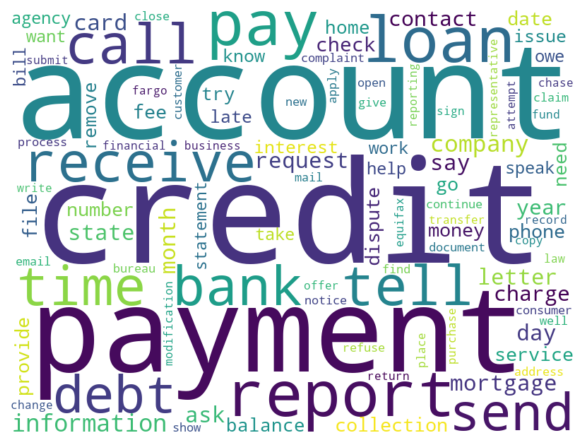

In [21]:
# grafico de frecuencia de palabras
# top 100 palabras
word_cloud = WordCloud(background_color="white",
                        width=800,height=600, collocations=False,
                        max_words=100).generate(' '.join(merged_data["clean_message"].values))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Veamos la distribución de tickets en la variable **product**

In [22]:
tickets_by_category = merged_data[merged_data["type"] == "train"]\
        .groupby(["product"], as_index=False, dropna=False)\
        .agg(tickets_number=("complaint-id",  "count"))

category_fig = px.bar(tickets_by_category,
                x='product', y='tickets_number', color='tickets_number',
                title="Ticktets por categoria", text_auto=True)

category_fig.update_layout(xaxis={'categoryorder':'total descending'}) 
category_fig.show()

Tenemos un total de categorias distintas, ademas no contamos con un distribucion uniforme en cuanto el número de ticket, es obvio que tenemos un conjunto de datos desbalanceado.

Para mitigar un poco este problema, podemos reducir la cantidad de categorias, combinando aquellas con muy pocos tickets en una nueva categoria para product.

Vamos a crear una nueva categoria llamada **"Others"** para agrupar dentro de esta **'Payday loan'**, **'Money transfers'**, **'Prepaid card'**, **'financial service'**,**'Virtual currency'**.

In [23]:
merged_data["new_product"] = merged_data["product"].map({
        'Debt collection': 'Debt collection', 
        'Mortgage':'Mortgage', 
        'Credit reporting': 'Credit reporting',
        'Credit card': 'Credit card',
        'Bank account or service': 'Bank account or service',
        'Consumer Loan': 'Consumer Loan', 
        'Student loan':'Student loan',
        'Payday loan': "Others",
        'Money transfers': "Others", 
        'Prepaid card': "Others",
        'Other financial service': "Others",
        'Virtual currency': "Others"})

In [24]:
# Almacenar el texto limpio
for _ in ["train", "test"]:
    merged_data.loc[merged_data["type"] == _,
           ["consumer-message", "clean_message", "product", "complaint-id", "new_product", "type"]
           ].to_csv(f"data/clean_text/{_}.csv", index=False)

Podemos ver que siguiemos teniendo un problema desbalanceado, reducimos el total de categorias para **prodcut** a sólo 8.

In [26]:
tickets_by_category = merged_data[merged_data["type"] == "train"]\
        .groupby(["new_product"], as_index=False, dropna=False)\
        .agg(tickets_number=("complaint-id",  "count"))

category_fig = px.bar(tickets_by_category, 
                x='new_product', y='tickets_number', color='tickets_number',
                title="Ticktets por categoría, después de agrupar", text_auto=True)

category_fig.update_layout(xaxis={'categoryorder':'total descending'}) 
category_fig.show()


Ya con lo datos, limpios y  la nueva agrupacion de datos, se realiza un inspeccion visiual de las palabras más relevantes que distiguen a cada categoria. Para ello se realizan un gráfico de wordClud  para cada categoria.

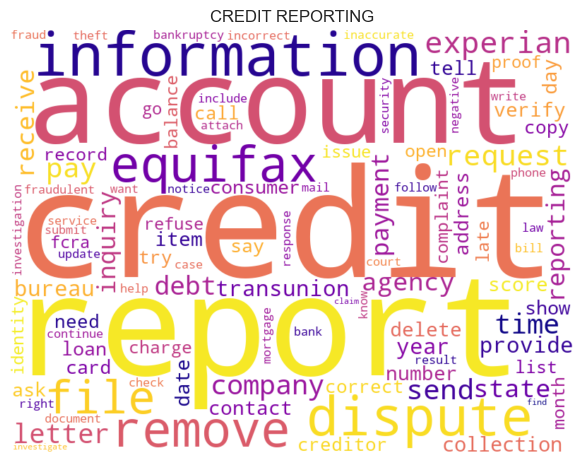

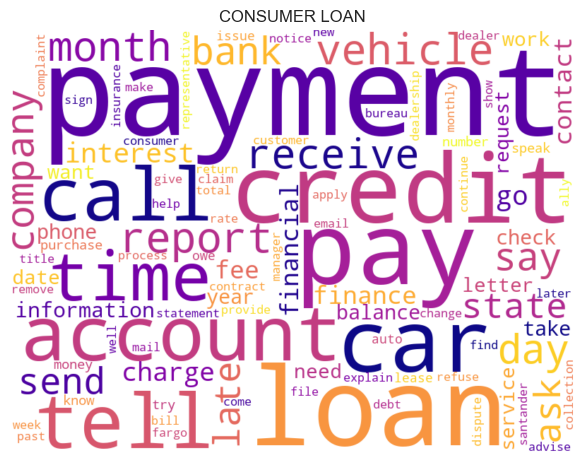

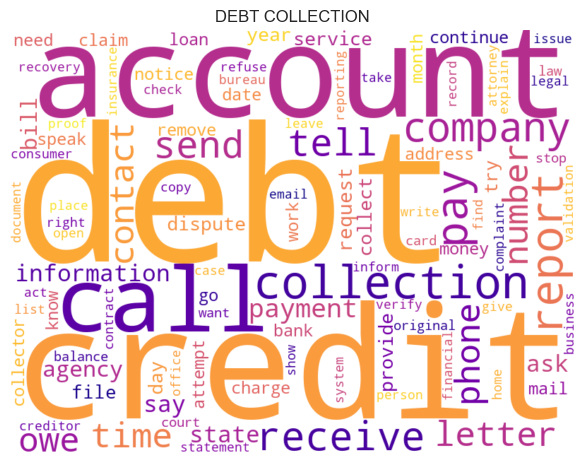

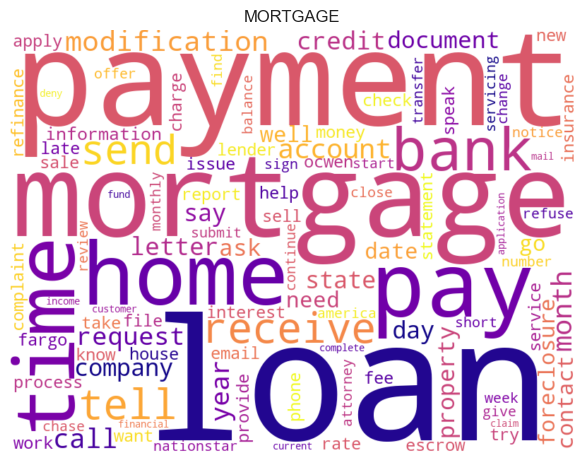

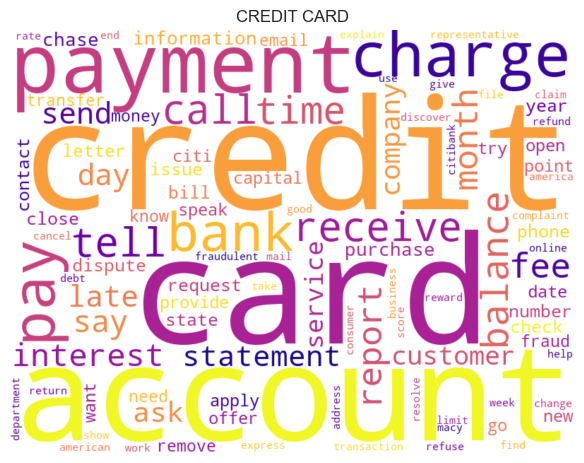

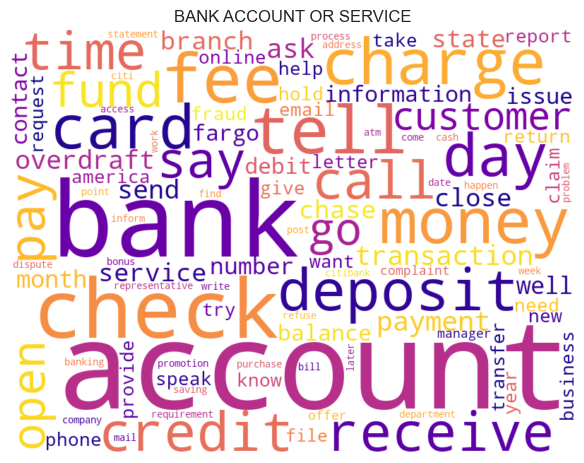

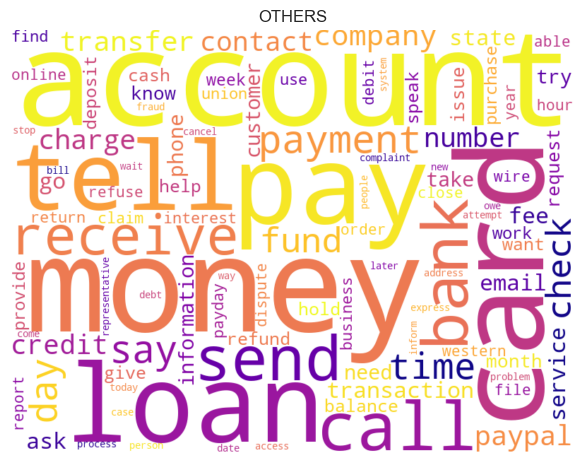

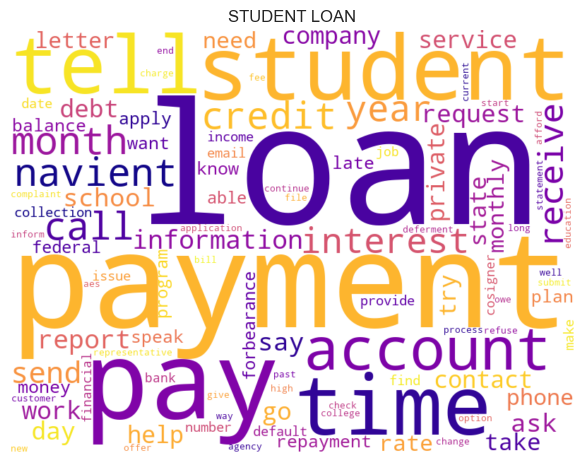

In [27]:
for _ in merged_data[merged_data["type"]=="train"]["new_product"].unique():
    products = merged_data.loc[merged_data["new_product"] == _]["clean_message"].values

    word_cloud = WordCloud(background_color="white",
                          width=800,height=600,
                           collocations=False,
                           colormap="plasma",
                           max_words=100).generate(' '.join(products))
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(_.upper())
    plt.show()
    del products, word_cloud

Con esto podemos identificar las palabras más relventantes que ayudan a distinguir cada producto, ya podemos saber que palabras se asocian a cada producto. 

In [28]:
for _ in merged_data[merged_data["type"]=="train"]["new_product"].unique():
    products = merged_data.loc[merged_data["new_product"] == _]["clean_message"]
    temp = pd.DataFrame.from_dict(word_number(products), orient="index")
    temp.columns = ["count"]
    temp = temp.sort_values(by=["count"], ascending=False)
    print(_,"\n" ,temp.head().index.tolist())


Credit reporting 
 ['credit', 'report', 'account', 'information', 'dispute']
Consumer Loan 
 ['payment', 'loan', 'pay', 'credit', 'car']
Debt collection 
 ['debt', 'credit', 'account', 'call', 'collection']
Mortgage 
 ['loan', 'payment', 'mortgage', 'pay', 'home']
Credit card 
 ['credit', 'card', 'account', 'payment', 'charge']
Bank account or service 
 ['account', 'bank', 'check', 'fee', 'tell']
Others 
 ['account', 'money', 'card', 'pay', 'loan']
Student loan 
 ['loan', 'payment', 'pay', 'student', 'time']


# Entrenamiento del modelo
Para modelar el modelo, se propone el uso de algoritmos clásicos de ML, dado que son más rápidos para entrenar a comparación de una red neural o el uso de transformers.

El flujo de trabajo para el entrenamiento del modelo es el siguiente:
1. Convertir el texto a una representación numérica
2.  Entrenar varios modelos para seleccionar el mejor candidato 
3. Hacer un ajuste de hiper parámetros del modelo seleccionado
4. Analizar el rendimiento del modelo
5. Interpretación del modelo
6. **Desplegar el modelo mediante una API**
7. **Mini app para interactuar con el modelo**
## 1 Convertir el texto a una representación numérica

Se usa el método de tf-idf term frequency–inverse document frequency para convertir el texto en una matriz de características para cada palabra dentro de los tickets, tf-idf crea una representación de cada palabra en términos de importancia en cada texto, una de sus limitaciones es que solo es capaz de detectar relaciones sintácticas dentro los textos, pero una de sus ventajas es que es bastante rápido hacer esta transformación.

Podemos crear nuestra matriz, usando unigrmas o n-grmas, pero por cuestiones prácticas solo se usan unigramas, también se quitan palabras que se encuentren en 95% de los textos, para evitar ruido entre las distintas categorías eliminando que se repiten mucho entre todas las clases.

Adicional se divide el conjunto de datos en dos partes, 20% de total del conjunto etiquetado para test y el el 80% para entrenar el modelo.

In [29]:
train = pd.read_csv("data/clean_text/train.csv")
test = pd.read_csv("data/clean_text/test.csv")
merged_data = pd.concat([train, test])

# usando unigramas
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1,1), 
                                   max_df=0.95)
# crear matrix tfidf
tfidf = tfidf_vectorizer.fit_transform(merged_data[merged_data["type"]=="train"]["clean_message"])
merged_data[merged_data["type"]=="train"].shape
print(tfidf.shape)

X_train, X_test, y_train, y_test = train_test_split(tfidf, 
                                        merged_data[merged_data["type"]=="train"]["new_product"], 
                                        test_size=0.2, random_state=10)

(133250, 76753)


## 2.  Entrenar varios modelos para seleccionar el mejor candidato 
En este paso se entrenaron varios modelos con configuraciones por defaults, para seleccionar el mejor estimador para este dataset, los modelos que se probaron fueron:

* Regresión logística multinomial
* Naive Bayes
* Random forest
* ExtraTress
* KNN

Para más detalle del proceso revisar `train_model.py`

In [30]:
models = SelectModel(X_train, y_train)
models.evaluate_models()

In [31]:
print(models.results)

                test_accuracy  test_f1_macro  test_precision_macro  \
multinomial_lg       0.851651       0.804716              0.829523   
niaveB               0.811886       0.735951              0.804707   
extra_tree           0.808368       0.706608              0.833068   
random_forest        0.807336       0.697790              0.832782   
knn_class            0.771520       0.717128              0.749983   

                test_recall_macro  
multinomial_lg           0.786453  
niaveB                   0.708914  
extra_tree               0.671101  
random_forest            0.666039  
knn_class                0.698459  


Para la seleccion del modelo se usa la métrica macro F1 score que es un promedio simple del f1 score para cada clase, y se considera como metrica principal de evaluación en este proyecto.

Dentro de los modelos entrenados la regresión logística arroja el mejor score con un valor de **0.8047**, así que este es el primer modelo candidato.

Asi que se entrane nuevamento el modelo ahora si usar CV considerando todo el conjunto de entrenamiento, se evalua el F score, para el conjunto de test para usarlo como metrica de referencia y ver si la podemos mejorar.

In [32]:
# vamos entrenar nuevamente el modelo sin usar CV
lr_model = LogisticRegression(multi_class='multinomial',
                              solver='lbfgs', max_iter=500)\
                              .fit(X_train, y_train)

# calculo f score en test_data
y_pred = lr_model.predict(X_test)
base_line_score = f1_score(y_test, y_pred, average="macro")
print("F1 score regresion logistica multinomial ", round(base_line_score * 100) / 100)


F1 score regresion logistica multinomial  0.81


Realicemos un análisis del modelo más a detalle, como era de esperarse el modelo no es bueno clasifiacando las categorias minoritarias, por ejemplo la precission para **Consumer Loan** y **Others** es de 0.66, 0.53 respectivamente, bastante bajo, mientras que para el resto de productos es de por lo menos del 0.8 tanto en precision como F score, y es especialmente bueno para clasificar **Mortage**, con un f scoree de 0.94.

In [33]:
# Evaluames de manera indivual cada categoria
print(classification_report(y_pred, y_test))

                         precision    recall  f1-score   support

Bank account or service       0.81      0.83      0.82      2389
          Consumer Loan       0.66      0.79      0.72      1285
            Credit card       0.83      0.82      0.82      3222
       Credit reporting       0.88      0.88      0.88      4993
        Debt collection       0.89      0.82      0.86      7187
               Mortgage       0.95      0.93      0.94      5781
                 Others       0.53      0.72      0.61       641
           Student loan       0.83      0.91      0.86      1152

               accuracy                           0.86     26650
              macro avg       0.80      0.84      0.81     26650
           weighted avg       0.86      0.86      0.86     26650



## 3. Hacer un ajuste de hiper parámetros del modelo seleccionado

Ya con un primer candidato de modelo, se trata de hacer un ajuste rápido en la penalización del modelo con la intención de mejor su rendimiento, se usa un grid search con varios valores para "C" usando regularización "L2".

In [96]:
param_grid = {
     'penalty' : ['l2'], 
     'C' : [0.0001, 0.001, 0.1, 1.0]}

logreg_cv = GridSearchCV(LogisticRegression(multi_class='multinomial', solver="lbfgs", max_iter=500),
                       param_grid=param_grid, cv=3,
                        scoring='f1_macro', 
                        #error_score="raise"
                        )

logreg_cv.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=LogisticRegression(max_iter=500,
                                          multi_class='multinomial'),
             param_grid={'C': [0.0001, 0.001, 0.1, 1.0], 'penalty': ['l2']},
             scoring='f1_macro')

Revisando los paramatreos óptimos resultado de la búsqueda en grid search, podemos ver que es igual que muestros modelo inicial con las configuraciones por default, así que nos quedamos con el primer modelo.

In [99]:
print(logreg_cv.best_params_)

{'C': 1.0, 'penalty': 'l2'}


## 4. Analizar el rendimiento de del modelo
Ya con un modelo a candidato final, podemos complementar su análisis con una visualización de la métricas de evaluación, y la matriz de con función del modelo final.

Con estos sólo reforzamos las creencias que tenemos desde el inicio, el modelo no es tan bueno clasificando las categorías minoritarias, debido a que se cuenta con un datase desbalanceado, generalmente este un problema muy común se podría mitigar tratando de conseguir más datos, aplicar algunas técnicas de sub o sobre muestreo o la generación de datos sintéticos.


<Axes: >

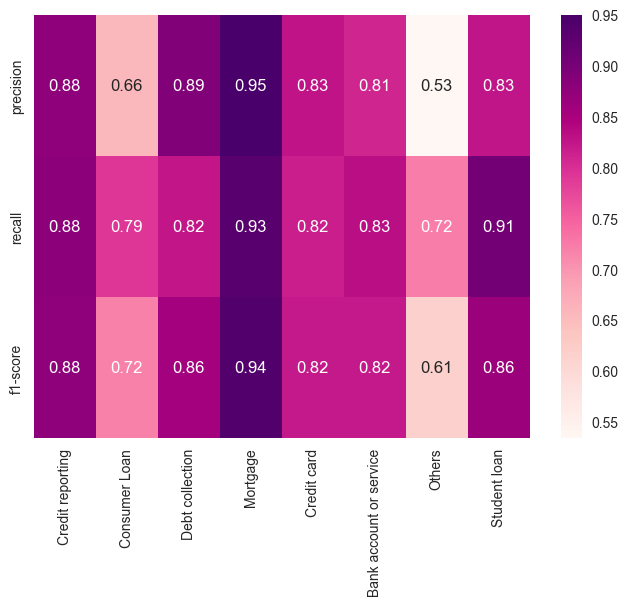

In [45]:
evaluation = classification_report(y_pred, y_test, output_dict=True)
evaluation = pd.DataFrame.from_dict(evaluation)
evaluation = evaluation.loc[evaluation.index != "support", ['Credit reporting','Consumer Loan', 'Debt collection', 'Mortgage',
 'Credit card', 'Bank account or service', 'Others', 'Student loan']]
sns.heatmap(evaluation, cmap='RdPu', annot=True)

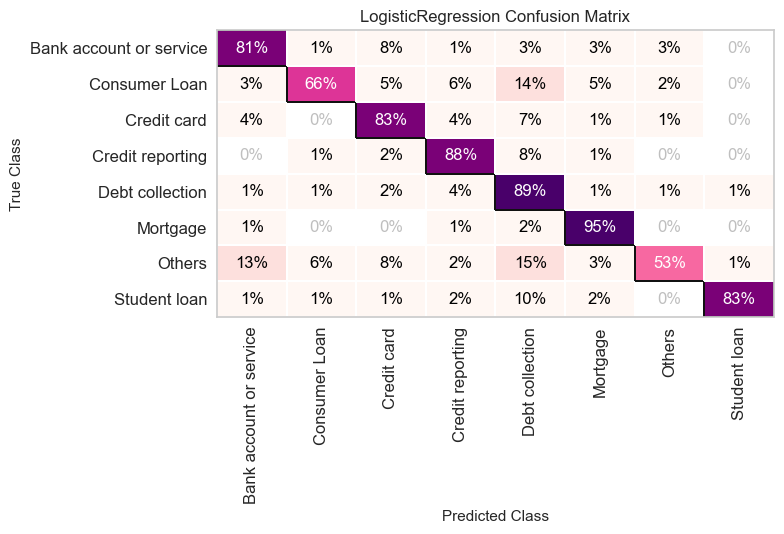

In [46]:
# matriz de confusion precision
mlg_cm = confusion_matrix(
    estimator=lr_model,
    X_train=X_train, y_train=y_train,
    X_test=X_test, y_test=y_test,
    percent=True,
    is_fitted=True,
    cmap="RdPu")

## 5. Interpretación de modelo

En este paso vamos a usar la metodología LIME, para interpretar nuestras predicciones con el base en texto que se ingrese al modelo.

Primero se crea un pipeline de sklearn  que convierta un texto limpio a su representación tfif, y después haga predicciones


In [34]:
# creamos el pipeline para prediccion
pipe_model = make_pipeline(tfidf_vectorizer, lr_model)

Se selecciona un mensaje aleatorio del conjunto de datos limpio, para ver su predicción y la influencia del texto con el resultado de modelo.
Solo se muestra el top 5 de palabras y las probabilidades de pronóstico para cada categoría.

Primero veamos el texto limpio y su clasificación real

In [42]:
example = merged_data.loc[merged_data["type"] == "train", 
                          ["clean_message", "new_product", "consumer-message"]].sample(random_state=887)
print("Texto ingresado: ", example["clean_message"].values[0], "\n")
print("Categoria real:", example["new_product"].values[0])

Texto ingresado:    keep charge account close intimidate dispute bill account rie basically try ruin credit rating reporting credit agency receive letter correspondence aggresive tactic end have pay charge excellent credit rating unfair shakedown live past year spend lot money phone try resolve dispute matter principle mind take advantage collection practise thank hear complaint 

Categoria real: Debt collection


In [43]:
explainer = LimeTextExplainer(class_names=list(pipe_model.classes_))
exp = explainer.explain_instance(example["clean_message"].values[0],
                                pipe_model.predict_proba,
                                num_features=5,
                                top_labels=3)

exp.show_in_notebook()

El modelo funciona relativamente bien, y realiza predicciones interpretables,  procedemos a guardarlo para usarlo en el siguiente fase del proyecto 

In [44]:
dump(pipe_model, 'model/mlr.joblib')

['model/mlr.joblib']

## Clasificar el archivo customer-issues-train.csv

Para probar el modelo se clasifican todo el todos los texto del archivo **customer-issues-train.csv**

In [56]:
test["clasificacion"] = pipe_model.predict(test["clean_message"].values.tolist())

Veamos un conteo de los textos clasificados.
Bastente bien.

In [68]:
summary_test = test.groupby(by=["clasificacion"], as_index=False)["complaint-id"].count()
fig = px.bar(summary_test, x='clasificacion', y='complaint-id', text_auto=True)
fig.show()

# 6 Desplegar el modelo mediante una API

Para poder consumir el modelo se realizo un API sencilla mediante la libreria FastApi, todo el código se encuentra en el archivo **main.py**, por razones obvias no se puede desarrollar la API dentro de un NoteBook


Podemos realizar una petición POST al método predict, con el texto que se deasea clasificar.

Accesible desde:

[https://shasa-challenge-dilwrjxvda-ue.a.run.app/predict/](https://shasa-challenge-dilwrjxvda-ue.a.run.app/predict/)

## Ejemplo

https://shasa-challenge-dilwrjxvda-ue.a.run.app/predict/I applied for a MasterCard through Barclaycard bank in XXXX of XXXX. On XXXX XXXX, XXXX, I received a letter from Barclaycard confirming my eligibility to receive XXXX ( XXXX ) benefits. The letter stated that the following terms would apply to my MasterCard Gold Card account as long as I was on XXXX XXXX.


![](api.JPG)

# 7 Mini app para interactuar con el modelo

Finalmente se hizo un mini app donde se le puede ingresar un texto, y esta app devuelve la predicción hecha por el modelo de manera más visual.
[https://shasa-challenge-viz-dilwrjxvda-ue.a.run.app/](https://shasa-challenge-viz-dilwrjxvda-ue.a.run.app/)


![](app.JPG)